In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
import random
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, KFold
from scipy.optimize import curve_fit
from sklearn.metrics import mean_squared_error
import warnings
warnings.filterwarnings('ignore')
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge, Lasso
from sklearn.metrics import mean_squared_error

## **Import the Data**

In [ ]:
# imported raw data across every country on economic measures and crisis
# indicators

raw_gc = pd.read_excel('global_crisis_data_SAAS.xlsx')
raw_gc

,Case,CC3,Country,Year,Banking_Crisis_Notes,Systemic Crisis,Gold Standard,exch_usd,exch_usd_alt1,exch_usd_alt2,...,Domestic_Debt_ Notes/Sources,"SOVEREIGN EXTERNAL DEBT 1: DEFAULT and RESTRUCTURINGS, 1800-2012--Does not include defaults on WWI debt to United States and United Kingdom and post-1975 defaults on Official External Creditors","SOVEREIGN EXTERNAL DEBT 2: DEFAULT and RESTRUCTURINGS, 1800-2012--Does not include defaults on WWI debt to United States and United Kingdom but includes post-1975 defaults on Official External Creditors",Defaults_External_Notes,GDP_Weighted_default,<,"Inflation, Annual percentages of average consumer prices",Independence,Currency Crises,Inflation Crises
0,NaN,NaN,NaN,NaN,NaN,x,x,NaN,NaN,NaN,...,NaN,x,NaN,NaN,x,x,NaN,x,x,x
1,1.0,DZA,Algeria,1800.0,NaN,0,0,NaN,NaN,NaN,...,NaN,0,0.0,NaN,0,NaN,NaN,0,0,0
2,1.0,DZA,Algeria,1801.0,NaN,0,0,NaN,NaN,NaN,...,NaN,0,0.0,NaN,0,NaN,NaN,0,0,0
3,1.0,DZA,Algeria,1802.0,NaN,0,0,NaN,NaN,NaN,...,NaN,0,0.0,NaN,0,NaN,NaN,0,0,0
4,1.0,DZA,Algeria,1803.0,NaN,0,0,NaN,NaN,NaN,...,NaN,0,0.0,NaN,0,NaN,NaN,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15186,70.0,ZWE,Zimbabwe,2012.0,NaN,0,NaN,361.9,NaN,NaN,...,NaN,1,1.0,NaN,0,0,3.72,1,0,0
15187,70.0,ZWE,Zimbabwe,2013.0,NaN,0,NaN,361.9,NaN,NaN,...,NaN,1,1.0,NaN,0,0,1.632,1,0,0
15188,70.0,ZWE,Zimbabwe,2014.0,NaN,0,NaN,NaN,NaN,NaN,...,NaN,1,1.0,NaN,0,0,-0.213,1,0,0
15189,70.0,ZWE,Zimbabwe,2015.0,NaN,0,NaN,NaN,NaN,NaN,...,NaN,1,1.0,NaN,0,NaN,-2.399,1,0,0


## **EDA**

In [ ]:
## Here, we will filter the data to remove all years before the Industrial Revoluton ended (1850).
gc_years = raw_gc[raw_gc['Year'] >= 1850.0]
gc_years

,Case,CC3,Country,Year,Banking_Crisis_Notes,Systemic Crisis,Gold Standard,exch_usd,exch_usd_alt1,exch_usd_alt2,...,Domestic_Debt_ Notes/Sources,"SOVEREIGN EXTERNAL DEBT 1: DEFAULT and RESTRUCTURINGS, 1800-2012--Does not include defaults on WWI debt to United States and United Kingdom and post-1975 defaults on Official External Creditors","SOVEREIGN EXTERNAL DEBT 2: DEFAULT and RESTRUCTURINGS, 1800-2012--Does not include defaults on WWI debt to United States and United Kingdom but includes post-1975 defaults on Official External Creditors",Defaults_External_Notes,GDP_Weighted_default,<,"Inflation, Annual percentages of average consumer prices",Independence,Currency Crises,Inflation Crises
51,1.0,DZA,Algeria,1850.0,NaN,0,0,0.051867,NaN,NaN,...,NaN,0,0.0,NaN,0,NaN,NaN,0,0,0
52,1.0,DZA,Algeria,1851.0,NaN,0,0,0.051414,NaN,NaN,...,NaN,0,0.0,NaN,0,NaN,NaN,0,0,0
53,1.0,DZA,Algeria,1852.0,NaN,0,0,0.051308,NaN,NaN,...,NaN,0,0.0,NaN,0,NaN,NaN,0,0,0
54,1.0,DZA,Algeria,1853.0,NaN,0,0,0.051308,NaN,NaN,...,NaN,0,0.0,NaN,0,NaN,NaN,0,0,0
55,1.0,DZA,Algeria,1854.0,NaN,0,0,0.051867,NaN,NaN,...,NaN,0,0.0,NaN,0,NaN,NaN,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15186,70.0,ZWE,Zimbabwe,2012.0,NaN,0,NaN,361.9,NaN,NaN,...,NaN,1,1.0,NaN,0,0,3.72,1,0,0
15187,70.0,ZWE,Zimbabwe,2013.0,NaN,0,NaN,361.9,NaN,NaN,...,NaN,1,1.0,NaN,0,0,1.632,1,0,0
15188,70.0,ZWE,Zimbabwe,2014.0,NaN,0,NaN,NaN,NaN,NaN,...,NaN,1,1.0,NaN,0,0,-0.213,1,0,0
15189,70.0,ZWE,Zimbabwe,2015.0,NaN,0,NaN,NaN,NaN,NaN,...,NaN,1,1.0,NaN,0,NaN,-2.399,1,0,0


In [ ]:
## Here, we dropped all unnecessary columns. We also had to remove inflation even though this is not ideal, as there were too many conflicting data types to
## do analysis on the column
gc_cleaned = gc_years.drop(columns=['Case','Country','Banking_Crisis_Notes','Gold Standard',
                                    'exch_usd_alt1','exch_usd_alt2','exch_usd_alt3','conversion_notes',
                                    'national currency','exch_primary source code','exch_sources',
                                    'Domestic_Debt_ Notes/Sources','SOVEREIGN EXTERNAL DEBT 1: DEFAULT and RESTRUCTURINGS, 1800-2012--Does not include defaults on WWI debt to United States and United Kingdom and post-1975 defaults on Official External Creditors',
                                    'Defaults_External_Notes','<',
                                    'Currency Crises','Inflation Crises'])
gc_cleaned

,CC3,Year,Systemic Crisis,exch_usd,Domestic_Debt_In_Default,"SOVEREIGN EXTERNAL DEBT 2: DEFAULT and RESTRUCTURINGS, 1800-2012--Does not include defaults on WWI debt to United States and United Kingdom but includes post-1975 defaults on Official External Creditors",GDP_Weighted_default,"Inflation, Annual percentages of average consumer prices",Independence
51,DZA,1850.0,0,0.051867,0,0.0,0,NaN,0
52,DZA,1851.0,0,0.051414,0,0.0,0,NaN,0
53,DZA,1852.0,0,0.051308,0,0.0,0,NaN,0
54,DZA,1853.0,0,0.051308,0,0.0,0,NaN,0
55,DZA,1854.0,0,0.051867,0,0.0,0,NaN,0
...,...,...,...,...,...,...,...,...,...
15186,ZWE,2012.0,0,361.9,1,1.0,0,3.72,1
15187,ZWE,2013.0,0,361.9,1,1.0,0,1.632,1
15188,ZWE,2014.0,0,NaN,1,1.0,0,-0.213,1
15189,ZWE,2015.0,0,NaN,1,1.0,0,-2.399,1


In [ ]:
## For clarity and easier readability, we renamed some of the columns.
gc_clean = gc_cleaned.rename(columns = {'CC3':'Country Code',
                                        'SOVEREIGN EXTERNAL DEBT 2: DEFAULT and RESTRUCTURINGS, 1800-2012--Does not include defaults on WWI debt to United States and United Kingdom but includes post-1975 defaults on Official External Creditors':'Defaulted on Sovereign External Debt',
                                        'Inflation, Annual percentages of average consumer prices':'Inflation (Annual %)'})
gc_clean

,Country Code,Year,Systemic Crisis,exch_usd,Domestic_Debt_In_Default,Defaulted on Sovereign External Debt,GDP_Weighted_default,Inflation (Annual %),Independence
51,DZA,1850.0,0,0.051867,0,0.0,0,NaN,0
52,DZA,1851.0,0,0.051414,0,0.0,0,NaN,0
53,DZA,1852.0,0,0.051308,0,0.0,0,NaN,0
54,DZA,1853.0,0,0.051308,0,0.0,0,NaN,0
55,DZA,1854.0,0,0.051867,0,0.0,0,NaN,0
...,...,...,...,...,...,...,...,...,...
15186,ZWE,2012.0,0,361.9,1,1.0,0,3.72,1
15187,ZWE,2013.0,0,361.9,1,1.0,0,1.632,1
15188,ZWE,2014.0,0,NaN,1,1.0,0,-0.213,1
15189,ZWE,2015.0,0,NaN,1,1.0,0,-2.399,1


In [ ]:
## In the Excel file, some of the NaN values were stored as strings called 'n/a'
## or exceptions #REF!
gc_clean.replace('n/a', np.nan, inplace = True)
gc_clean.replace('#REF!', np.nan, inplace = True)
gc_clean.replace('', np.nan, inplace = True)
gc_clean.replace(' ', np.nan, inplace = True)
gc_clean

,Country Code,Year,Systemic Crisis,exch_usd,Domestic_Debt_In_Default,Defaulted on Sovereign External Debt,GDP_Weighted_default,Inflation (Annual %),Independence
51,DZA,1850.0,0.0,0.051867,0.0,0.0,0.0,NaN,0
52,DZA,1851.0,0.0,0.051414,0.0,0.0,0.0,NaN,0
53,DZA,1852.0,0.0,0.051308,0.0,0.0,0.0,NaN,0
54,DZA,1853.0,0.0,0.051308,0.0,0.0,0.0,NaN,0
55,DZA,1854.0,0.0,0.051867,0.0,0.0,0.0,NaN,0
...,...,...,...,...,...,...,...,...,...
15186,ZWE,2012.0,0.0,361.900000,1.0,1.0,0.0,3.72,1
15187,ZWE,2013.0,0.0,361.900000,1.0,1.0,0.0,1.632,1
15188,ZWE,2014.0,0.0,NaN,1.0,1.0,0.0,-0.213,1
15189,ZWE,2015.0,0.0,NaN,1.0,1.0,0.0,-2.399,1


In [ ]:
## Here, we realized that some of the zero values were stored as strings,
## and this interfered with generating the correlation matrix, so we're converting them to floats
gc_clean['Domestic_Debt_In_Default'] = gc_clean['Domestic_Debt_In_Default'].apply(lambda x:float(x))
gc_clean['GDP_Weighted_default'] = gc_clean['GDP_Weighted_default'].apply(lambda x:float(x))
gc_clean['Independence'] = gc_clean['Independence'].apply(lambda x:float(x))
gc_clean['exch_usd'] = gc_clean['exch_usd'].apply(lambda x:float(x))
gc_clean['Inflation (Annual %)'] = pd.to_numeric(gc_clean['Inflation (Annual %)'], errors='coerce')
gc_clean

,Country Code,Year,Systemic Crisis,exch_usd,Domestic_Debt_In_Default,Defaulted on Sovereign External Debt,GDP_Weighted_default,Inflation (Annual %),Independence
51,DZA,1850.0,0.0,0.051867,0.0,0.0,0.0,NaN,0.0
52,DZA,1851.0,0.0,0.051414,0.0,0.0,0.0,NaN,0.0
53,DZA,1852.0,0.0,0.051308,0.0,0.0,0.0,NaN,0.0
54,DZA,1853.0,0.0,0.051308,0.0,0.0,0.0,NaN,0.0
55,DZA,1854.0,0.0,0.051867,0.0,0.0,0.0,NaN,0.0
...,...,...,...,...,...,...,...,...,...
15186,ZWE,2012.0,0.0,361.900000,1.0,1.0,0.0,3.720,1.0
15187,ZWE,2013.0,0.0,361.900000,1.0,1.0,0.0,1.632,1.0
15188,ZWE,2014.0,0.0,NaN,1.0,1.0,0.0,-0.213,1.0
15189,ZWE,2015.0,0.0,NaN,1.0,1.0,0.0,-2.399,1.0


In [ ]:
## (Cyclical Stability Theory): Due to the cyclical nature of
## economic up/downturns, we will impute NaN values using the mean of the surrounding 10 years.

def impute_with_window_mean(series):
    # Iterate over each element in the series using enumerate for index tracking
    for i, value in enumerate(series):
        if pd.isna(value):
            # Define the window boundaries, ensuring they are within the range of the series
            start = max(i - 10, 0)
            end = min(i + 10, len(series) - 1)
            # Calculate the mean of the window, excluding the current NaN value
            window_mean = series.iloc[start:end + 1].mean()
            # Impute the NaN with the calculated mean
            series.iloc[i] = window_mean
    return series

gc_final = gc_clean.apply(impute_with_window_mean)

In [ ]:
## Even though we imputed the NaN values, we realized that some of the missing data was
## still stored as zeroes.

def impute_with_window_mean_zero(series):
    # Iterate over each element in the series using enumerate for index tracking
    for i, value in enumerate(series):
        if value == 0:
            # Define the window boundaries, ensuring they are within the range of the series
            start = max(i - 10, 0)
            end = min(i + 10, len(series) - 1)
            # Calculate the mean of the window, excluding the current NaN value
            window_mean = series.iloc[start:end + 1].mean()
            # Impute the NaN with the calculated mean
            series.iloc[i] = window_mean
    return series

gc_final['exch_usd'] = impute_with_window_mean_zero(gc_final['exch_usd'])

In [ ]:
gdp_raw = pd.read_excel('mpd2020.xlsx',sheet_name='Full data')
gdp_raw

,countrycode,country,year,gdppc,pop
0,AFG,Afghanistan,1820,NaN,3280.00000
1,AFG,Afghanistan,1870,NaN,4207.00000
2,AFG,Afghanistan,1913,NaN,5730.00000
3,AFG,Afghanistan,1950,1156.0000,8150.00000
4,AFG,Afghanistan,1951,1170.0000,8284.00000
...,...,...,...,...,...
21677,ZWE,Zimbabwe,2014,1594.0000,13313.99205
21678,ZWE,Zimbabwe,2015,1560.0000,13479.13812
21679,ZWE,Zimbabwe,2016,1534.0000,13664.79457
21680,ZWE,Zimbabwe,2017,1582.3662,13870.26413


In [ ]:
gdp_years = gdp_raw[gdp_raw['year'] >= 1850.0]
gdp_years

,countrycode,country,year,gdppc,pop
1,AFG,Afghanistan,1870,NaN,4207.00000
2,AFG,Afghanistan,1913,NaN,5730.00000
3,AFG,Afghanistan,1950,1156.0000,8150.00000
4,AFG,Afghanistan,1951,1170.0000,8284.00000
5,AFG,Afghanistan,1952,1189.0000,8425.00000
...,...,...,...,...,...
21677,ZWE,Zimbabwe,2014,1594.0000,13313.99205
21678,ZWE,Zimbabwe,2015,1560.0000,13479.13812
21679,ZWE,Zimbabwe,2016,1534.0000,13664.79457
21680,ZWE,Zimbabwe,2017,1582.3662,13870.26413


In [ ]:
gdp_names = gdp_years.drop(columns=['country'])
gdp_names

,countrycode,year,gdppc,pop
1,AFG,1870,NaN,4207.00000
2,AFG,1913,NaN,5730.00000
3,AFG,1950,1156.0000,8150.00000
4,AFG,1951,1170.0000,8284.00000
5,AFG,1952,1189.0000,8425.00000
...,...,...,...,...
21677,ZWE,2014,1594.0000,13313.99205
21678,ZWE,2015,1560.0000,13479.13812
21679,ZWE,2016,1534.0000,13664.79457
21680,ZWE,2017,1582.3662,13870.26413


In [ ]:
# rename, especially "year" and "countrycode", to match with our other df
gdp_clean = gdp_names.rename(columns={'year':'Year','countrycode':'Country Code','gdppc': 'GDP_per_capita','pop':'population'})
gdp_clean

,Country Code,Year,GDP_per_capita,population
1,AFG,1870,NaN,4207.00000
2,AFG,1913,NaN,5730.00000
3,AFG,1950,1156.0000,8150.00000
4,AFG,1951,1170.0000,8284.00000
5,AFG,1952,1189.0000,8425.00000
...,...,...,...,...
21677,ZWE,2014,1594.0000,13313.99205
21678,ZWE,2015,1560.0000,13479.13812
21679,ZWE,2016,1534.0000,13664.79457
21680,ZWE,2017,1582.3662,13870.26413


In [ ]:
#make Year into float values
gdp_clean['Year'] = gdp_clean['Year'].apply(lambda x:float(x))
gdp_clean

,Country Code,Year,GDP_per_capita,population
1,AFG,1870.0,NaN,4207.00000
2,AFG,1913.0,NaN,5730.00000
3,AFG,1950.0,1156.0000,8150.00000
4,AFG,1951.0,1170.0000,8284.00000
5,AFG,1952.0,1189.0000,8425.00000
...,...,...,...,...
21677,ZWE,2014.0,1594.0000,13313.99205
21678,ZWE,2015.0,1560.0000,13479.13812
21679,ZWE,2016.0,1534.0000,13664.79457
21680,ZWE,2017.0,1582.3662,13870.26413


In [ ]:
# Impute NaN values with mean of surrounding years.
gdp_clean = gdp_clean.apply(impute_with_window_mean)
gdp_clean

,Country Code,Year,GDP_per_capita,population
1,AFG,1870.0,1230.555556,4207.00000
2,AFG,1913.0,1237.505051,5730.00000
3,AFG,1950.0,1156.000000,8150.00000
4,AFG,1951.0,1170.000000,8284.00000
5,AFG,1952.0,1189.000000,8425.00000
...,...,...,...,...
21677,ZWE,2014.0,1594.000000,13313.99205
21678,ZWE,2015.0,1560.000000,13479.13812
21679,ZWE,2016.0,1534.000000,13664.79457
21680,ZWE,2017.0,1582.366200,13870.26413


Here, we will take the product of `GDP_per_capita` and `population` and store this column as `real GDP`. We will then drop the former two. This is because:

<center> GDP per capita $= \frac{real \space GDP}{population}$</center>

In [ ]:
gdp_clean['real GDP'] = gdp_clean['GDP_per_capita']*gdp_clean['population']
gdp_final = gdp_clean.drop(columns=['population','GDP_per_capita'])

In [ ]:
#perform merge of the dataframes
gc_and_gdp = pd.merge(gc_final, gdp_final, on=['Country Code','Year'], how = 'inner')
gc_and_gdp

,Country Code,Year,Systemic Crisis,exch_usd,Domestic_Debt_In_Default,Defaulted on Sovereign External Debt,GDP_Weighted_default,Inflation (Annual %),Independence,real GDP
0,DZA,1870.0,1.0,0.052264,0.0,0.0,0.0,3.441456,0.0,4.304640e+06
1,DZA,1913.0,0.0,0.052060,0.0,0.0,0.0,-3.382589,0.0,1.019144e+07
2,DZA,1950.0,0.0,3.499000,0.0,0.0,0.0,0.000000,0.0,1.935055e+07
3,DZA,1951.0,0.0,3.500000,0.0,0.0,0.0,6.741573,0.0,1.948038e+07
4,DZA,1952.0,0.0,3.500000,0.0,0.0,0.0,6.315789,0.0,2.035000e+07
...,...,...,...,...,...,...,...,...,...,...
8919,ZWE,2012.0,0.0,361.900000,1.0,1.0,0.0,3.720000,1.0,2.090997e+07
8920,ZWE,2013.0,0.0,361.900000,1.0,1.0,0.0,1.632000,1.0,2.112350e+07
8921,ZWE,2014.0,0.0,181.870200,1.0,1.0,0.0,-0.213000,1.0,2.122250e+07
8922,ZWE,2015.0,0.0,200.057220,1.0,1.0,0.0,-2.399000,1.0,2.102746e+07


In [ ]:
# Remove Country Code column to generate the correlation matrix.

corr_gc_and_gdp = gc_and_gdp.drop(columns='Country Code')
corr_gc_and_gdp

,Year,Systemic Crisis,exch_usd,Domestic_Debt_In_Default,Defaulted on Sovereign External Debt,GDP_Weighted_default,Inflation (Annual %),Independence,real GDP
0,1870.0,1.0,0.052264,0.0,0.0,0.0,3.441456,0.0,4.304640e+06
1,1913.0,0.0,0.052060,0.0,0.0,0.0,-3.382589,0.0,1.019144e+07
2,1950.0,0.0,3.499000,0.0,0.0,0.0,0.000000,0.0,1.935055e+07
3,1951.0,0.0,3.500000,0.0,0.0,0.0,6.741573,0.0,1.948038e+07
4,1952.0,0.0,3.500000,0.0,0.0,0.0,6.315789,0.0,2.035000e+07
...,...,...,...,...,...,...,...,...,...
8919,2012.0,0.0,361.900000,1.0,1.0,0.0,3.720000,1.0,2.090997e+07
8920,2013.0,0.0,361.900000,1.0,1.0,0.0,1.632000,1.0,2.112350e+07
8921,2014.0,0.0,181.870200,1.0,1.0,0.0,-0.213000,1.0,2.122250e+07
8922,2015.0,0.0,200.057220,1.0,1.0,0.0,-2.399000,1.0,2.102746e+07


In [ ]:
corr_gc_and_gdp['Systemic Crisis'] = corr_gc_and_gdp['Systemic Crisis'].shift(1)

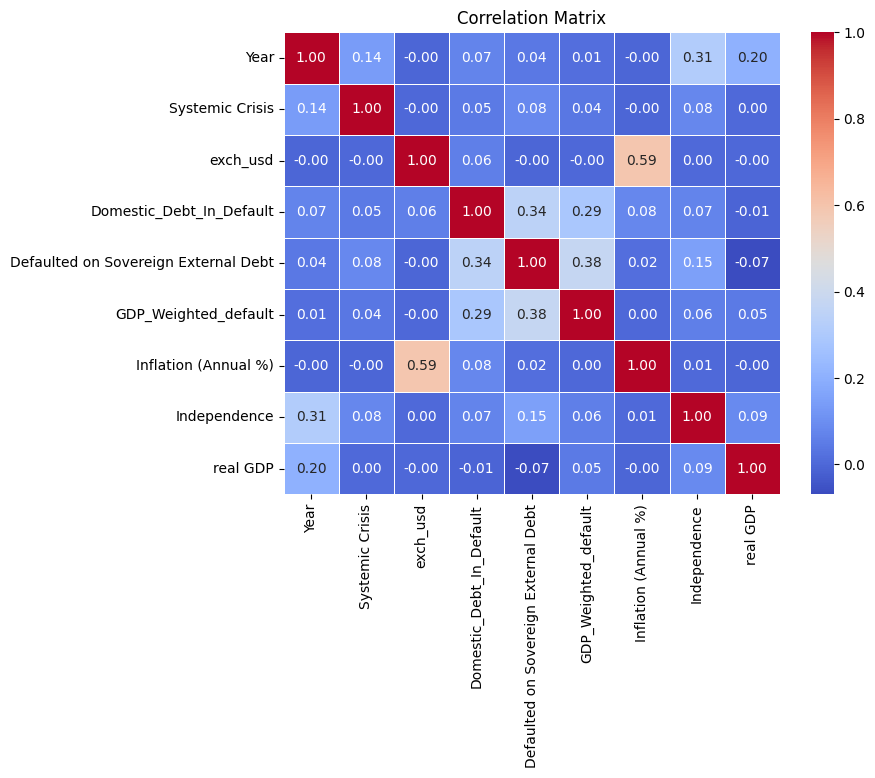

In [ ]:
#correlation matrix!! this will help us decide what to visualize/predict in the future

# Compute the correlation matrix
correlation_matrix = corr_gc_and_gdp.corr()

# Create a heatmap using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

# **Modeling**

Exploring relationships between potential explanatory variables

In [ ]:
# Removing outliers so that we can plot easily
gc_and_gdp_plot = gc_and_gdp[gc_and_gdp['exch_usd']<=100]
gc_and_gdp_plot = gc_and_gdp_plot[gc_and_gdp_plot['Inflation (Annual %)']<=200]

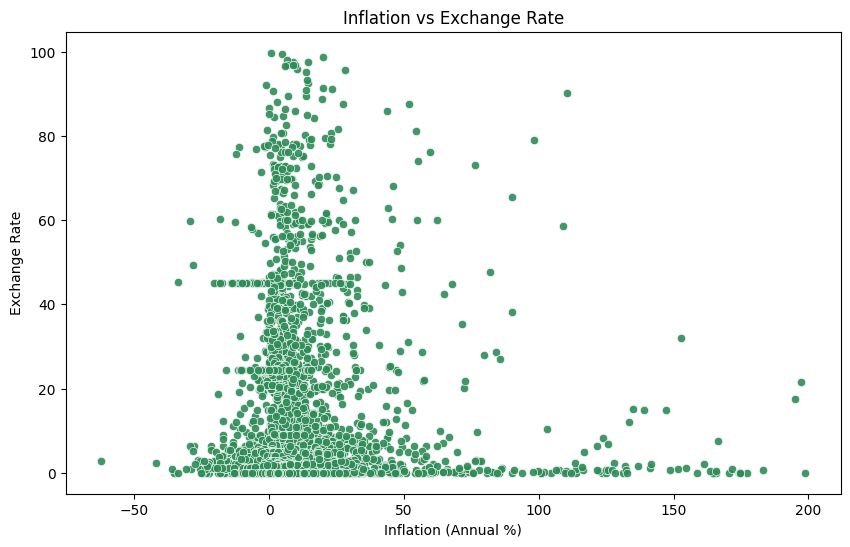

In [ ]:
# Plotting
plt.figure(figsize=(10, 6))
sns.scatterplot(data=gc_and_gdp_plot, x='Inflation (Annual %)',
                alpha = 0.9, y='exch_usd', color='seagreen')
# Adding labels and title
plt.title('Inflation vs Exchange Rate')
plt.xlabel('Inflation (Annual %)')
plt.ylabel('Exchange Rate')

# Show plot
plt.show()

Here, we noticed that this looks a lot like:



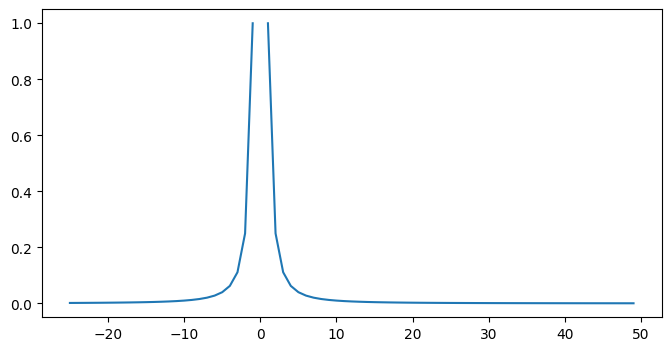

In [ ]:
## This is just an arbitrary function we used to demonstrate what the
## shape of the distribution of the scatter plot resembled.
x_demo = np.array(list(range(-25,50)))
y_demo = 1/(x_demo)**2

plt.figure(figsize=(8,4))
plt.plot(x_demo,y_demo)

In [ ]:
x = gc_and_gdp['Inflation (Annual %)']
y = gc_and_gdp['exch_usd']

In [ ]:
# Transforming variable to see a better relationship
X = np.sqrt(x)

#concatinate
scatter_gc_gdp_transformed = pd.concat([X, y], axis = 1)
scatter_gc_gdp_transformed

,Inflation (Annual %),exch_usd
0,1.855116,0.052264
1,NaN,0.052060
2,0.000000,3.499000
3,2.596454,3.500000
4,2.513123,3.500000
...,...,...
8919,1.928730,361.900000
8920,1.277498,361.900000
8921,NaN,181.870200
8922,NaN,200.057220


In [ ]:
# removing outliers again

scatter_gc_gdp_transformed_plot = scatter_gc_gdp_transformed[scatter_gc_gdp_transformed['exch_usd']<=100]
scatter_gc_gdp_transformed_plot = scatter_gc_gdp_transformed_plot[scatter_gc_gdp_transformed_plot['Inflation (Annual %)']<=200]

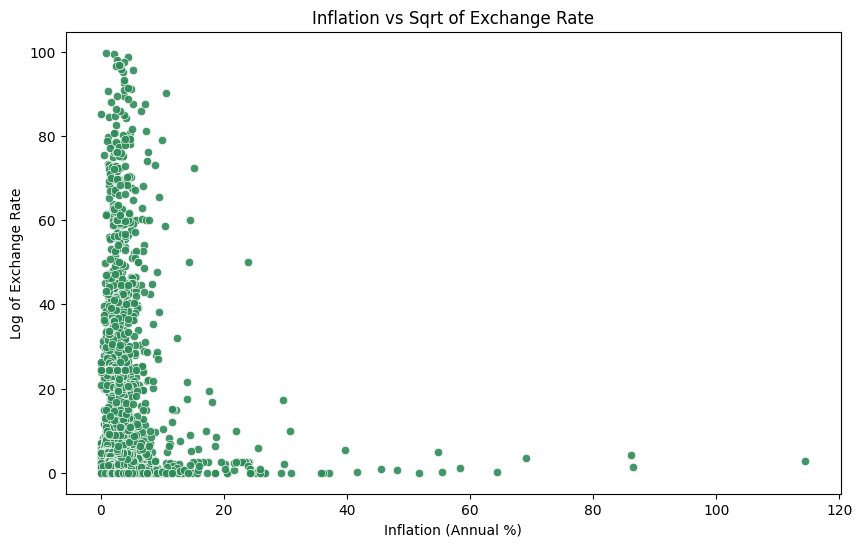

In [ ]:
# Plotting
plt.figure(figsize=(10, 6))
sns.scatterplot(data=scatter_gc_gdp_transformed_plot, x='Inflation (Annual %)',
                alpha = 0.9, y='exch_usd', color='seagreen')

# Adding labels and title
plt.title('Inflation vs Sqrt of Exchange Rate')
plt.xlabel('Inflation (Annual %)')
plt.ylabel('Log of Exchange Rate')

# Show plot
plt.show()

Here, we realized the transformation didn't yield great results. We also aren't doing OLS regression so we realized there isn't much need to make a transformation like this anyway, so we decided to proceed with building the model.

## Attempt #1: Logistic Regression
We will drop the country codes for now as this is a categorical variable. To this end, we will reuse `corr_gc_and_gdp`.

In [ ]:
corr_gc_and_gdp

,Year,Systemic Crisis,exch_usd,Domestic_Debt_In_Default,Defaulted on Sovereign External Debt,GDP_Weighted_default,Inflation (Annual %),Independence,real GDP
0,1870.0,1.0,0.052264,0.0,0.0,0.0,3.441456,0.0,4.304640e+06
1,1913.0,0.0,0.052060,0.0,0.0,0.0,-3.382589,0.0,1.019144e+07
2,1950.0,0.0,3.499000,0.0,0.0,0.0,0.000000,0.0,1.935055e+07
3,1951.0,0.0,3.500000,0.0,0.0,0.0,6.741573,0.0,1.948038e+07
4,1952.0,0.0,3.500000,0.0,0.0,0.0,6.315789,0.0,2.035000e+07
...,...,...,...,...,...,...,...,...,...
8919,2012.0,0.0,361.900000,1.0,1.0,0.0,3.720000,1.0,2.090997e+07
8920,2013.0,0.0,361.900000,1.0,1.0,0.0,1.632000,1.0,2.112350e+07
8921,2014.0,0.0,181.870200,1.0,1.0,0.0,-0.213000,1.0,2.122250e+07
8922,2015.0,0.0,200.057220,1.0,1.0,0.0,-2.399000,1.0,2.102746e+07


Here, we realized that storing the Systemic Crisis predictor variable as a float would throw ValueError exceptions because SKLearn thinks the `Systemic Crisis` column is continuous.

In [ ]:
corr_gc_and_gdp['Systemic Crisis'] = corr_gc_and_gdp['Systemic Crisis'].apply(lambda x:int(x))
corr_gc_and_gdp

,Year,Systemic Crisis,exch_usd,Domestic_Debt_In_Default,Defaulted on Sovereign External Debt,GDP_Weighted_default,Inflation (Annual %),Independence,real GDP
0,1870.0,1,0.052264,0.0,0.0,0.0,3.441456,0.0,4.304640e+06
1,1913.0,0,0.052060,0.0,0.0,0.0,-3.382589,0.0,1.019144e+07
2,1950.0,0,3.499000,0.0,0.0,0.0,0.000000,0.0,1.935055e+07
3,1951.0,0,3.500000,0.0,0.0,0.0,6.741573,0.0,1.948038e+07
4,1952.0,0,3.500000,0.0,0.0,0.0,6.315789,0.0,2.035000e+07
...,...,...,...,...,...,...,...,...,...
8919,2012.0,0,361.900000,1.0,1.0,0.0,3.720000,1.0,2.090997e+07
8920,2013.0,0,361.900000,1.0,1.0,0.0,1.632000,1.0,2.112350e+07
8921,2014.0,0,181.870200,1.0,1.0,0.0,-0.213000,1.0,2.122250e+07
8922,2015.0,0,200.057220,1.0,1.0,0.0,-2.399000,1.0,2.102746e+07


In [ ]:
feature_cols = ['Year','exch_usd','GDP_Weighted_default','Inflation (Annual %)','Independence','real GDP']
X = corr_gc_and_gdp[feature_cols]
y = corr_gc_and_gdp['Systemic Crisis']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=32)

from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(random_state=32)
logreg.fit(X_train, y_train)

y_pred = logreg.predict(X_test)

Here, we created a table to compare `y_pred` and `y_test`.

In [ ]:
logreg_predict = X_test
logreg_predict['actual'] = y_test
logreg_predict['predicted'] = y_pred
logreg_predict

,Year,exch_usd,GDP_Weighted_default,Inflation (Annual %),Independence,real GDP,actual,predicted
2006,1891.0,3.748200,0.0,9.522435,1.0,9.412703e+06,0,0
2001,1886.0,3.733700,0.0,-4.650507,1.0,8.241212e+06,0,0
600,2002.0,0.953562,0.0,1.700000,1.0,2.912255e+08,0,0
3573,1873.0,2.212400,0.0,2.951773,0.0,1.131225e+09,0,0
5893,1915.0,1.000000,0.0,2.997294,1.0,1.583529e+07,0,0
...,...,...,...,...,...,...,...,...
8738,1965.0,0.004484,0.0,2.714932,1.0,1.300948e+08,0,0
6267,2002.0,53.096000,0.0,2.723000,1.0,3.535684e+08,0,0
8061,1938.0,1.257100,0.0,-0.600963,1.0,3.758834e+07,0,0
1203,1993.0,1.321500,0.0,1.865000,1.0,8.545963e+08,0,0


In [ ]:
## Generate the confusion matrix.
from sklearn import metrics

cm = metrics.confusion_matrix(y_test, y_pred)
print(cm)

## Interpreting the confusion matrix.

TN = cm.ravel()[0]
FP = cm.ravel()[1]
FN = cm.ravel()[2]
TP = cm.ravel()[3]


precision= TP/(TP+FP)
recall = TP/(TP+FN)

[[1688    1]
 [  96    0]]


In [ ]:
# analysis metrics

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))

Accuracy: 0.9456582633053221
Recall: 0.0
Precision: 0.0


Here, we realized that 95% of our data is labeled `0`, as in no systemic crisis. Hence, it is inevitable that our logistic regression model would overfit on the non-crisis data.

## Attempt #2: Decision Tree

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [ ]:
feature_cols = ['Year','exch_usd','GDP_Weighted_default','Inflation (Annual %)','Independence','real GDP']
X = corr_gc_and_gdp[feature_cols]
y = corr_gc_and_gdp['Systemic Crisis']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

In [ ]:
results = []

for depth in range(1, 21):  # start depth from 1 as depth 0 is not valid for a decision tree
    clf = DecisionTreeClassifier(max_depth=depth, random_state=42)
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)

    recall = metrics.recall_score(y_test, y_pred)
    precision = metrics.precision_score(y_test, y_pred)

    # Append the results in the list
    results.append({'Depth': depth, 'Recall': recall, 'Precision': precision})

# Convert the list to a DataFrame
results_df = pd.DataFrame(results)
results_df.sort_values(['Recall'],ascending=[False])

,Depth,Recall,Precision
19,20,0.522727,0.377049
18,19,0.522727,0.377049
17,18,0.511364,0.381356
16,17,0.500000,0.376068
14,15,0.500000,0.403670
15,16,0.488636,0.377193
13,14,0.488636,0.413462
12,13,0.465909,0.383178
11,12,0.409091,0.444444
10,11,0.397727,0.460526


In [ ]:
# analysis metrics
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Recall:",metrics.recall_score(y_test, y_pred))
print("Precision:",metrics.precision_score(y_test, y_pred))

Accuracy: 0.9338935574229692
Recall: 0.5227272727272727
Precision: 0.3770491803278688


In [ ]:
#decision tree
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('systemic_crisis.png')
Image(graph.create_png())

Recall of 50% and precision 40% is definitely a great improvement from 0 and NaN T_T but it's still not great. This is most likely because the data is heavily skewed, with 95% of our data having `0` for `Systemic Crisis`, i.e. no systemic crisis, and only 5% having `1`, i.e. in systemic crisis. As a result, our classifiers have inevitably overfitted on the non-crisis data.

Idea

At this stage, we're wondering whether we should just build a multiple regression model instead? We can use `real GDP` as the dependent variable to predict. In our project spec, we also found an IMF paper with definitions of real GDP figures that would constitute a systemic crisis. Hence, if we build a regression model, we could use it to predict real GDP figures, and if the predicted figures fall below the specified minimum for real GDP, it would consistute a crisis (and no crisis otherwise).



## Attempt #3: SMOTE Oversampling
> To address the problem of imbalanced data, where 95% of our data are non-crisis years, we implemented Synthetic Minority Oversampling Technique (SMOTE), which involves bootstrapping our crisis data.

In [ ]:
from imblearn.over_sampling import SMOTE

In [ ]:
feature_cols = ['Year','exch_usd','GDP_Weighted_default','Inflation (Annual %)','Independence','real GDP']
X = corr_gc_and_gdp[feature_cols]
y = corr_gc_and_gdp['Systemic Crisis']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

# Oversample the minority data with SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

### Creating Another Decision Tree using SMOTE resampled data

In [ ]:
results = []

for depth in range(1, 21):  # start depth from 1 as depth 0 is not valid for a decision tree
  for leaf_node in range(10,100,10):
    clf = DecisionTreeClassifier(max_depth=depth, max_leaf_nodes = leaf_node, random_state=42)
    clf.fit(X_train_smote, y_train_smote)
    y_pred_smote = clf.predict(X_test)

    accuracy = metrics.accuracy_score(y_test, y_pred_smote)
    recall = metrics.recall_score(y_test, y_pred_smote)
    precision = metrics.precision_score(y_test, y_pred_smote)
    f1_score = metrics.f1_score(y_test, y_pred_smote)

    # Append the results in the list
    results.append({'Depth': depth, 'Leaf Nodes': leaf_node, 'Accuracy': accuracy, 'Recall': recall, 'Precision': precision, 'f1 Score': f1_score})

# Convert the list to a DataFrame
results_df = pd.DataFrame(results)

# Print the complete results table
results_df

,Depth,Leaf Nodes,Accuracy,Recall,Precision,f1 Score
0,1,10,0.736134,0.681818,0.119284,0.203046
1,1,20,0.736134,0.681818,0.119284,0.203046
2,1,30,0.736134,0.681818,0.119284,0.203046
3,1,40,0.736134,0.681818,0.119284,0.203046
4,1,50,0.736134,0.681818,0.119284,0.203046
...,...,...,...,...,...,...
175,20,50,0.754622,0.761364,0.138430,0.234266
176,20,60,0.771429,0.761364,0.147577,0.247232
177,20,70,0.761345,0.750000,0.140426,0.236559
178,20,80,0.763585,0.738636,0.140086,0.235507


In [ ]:
results_df.sort_values(['Recall'], ascending=[False])

,Depth,Leaf Nodes,Accuracy,Recall,Precision,f1 Score
92,11,30,0.694118,0.806818,0.118333,0.206395
93,11,40,0.749580,0.806818,0.141717,0.241087
103,12,50,0.721569,0.795455,0.127505,0.219780
102,12,40,0.722129,0.795455,0.127737,0.220126
83,10,30,0.691317,0.795455,0.116086,0.202605
...,...,...,...,...,...,...
42,5,70,0.778151,0.522727,0.115000,0.188525
40,5,50,0.778151,0.522727,0.115000,0.188525
39,5,40,0.778151,0.522727,0.115000,0.188525
36,5,10,0.769188,0.522727,0.110577,0.182540


Maximum recall of 80% omg! That's so much better 💯 But we don't want to neglect precision either, so we'll stick with `depth = 11` and `max leaf nodes = 60`

In [ ]:
final_clf = DecisionTreeClassifier(max_depth=11, max_leaf_nodes= 60, random_state=42)
final_clf.fit(X_train_smote, y_train_smote)
y_pred_final = final_clf.predict(X_test)


print("Accuracy:",metrics.accuracy_score(y_test, y_pred_final))
print("Recall:",metrics.recall_score(y_test, y_pred_final))
print("Precision:",metrics.precision_score(y_test, y_pred_final))
print("F1 Score:",metrics.f1_score(y_test, y_pred_final))

Accuracy: 0.7843137254901961
Recall: 0.7727272727272727
Precision: 0.15704387990762125
F1 Score: 0.2610364683301344


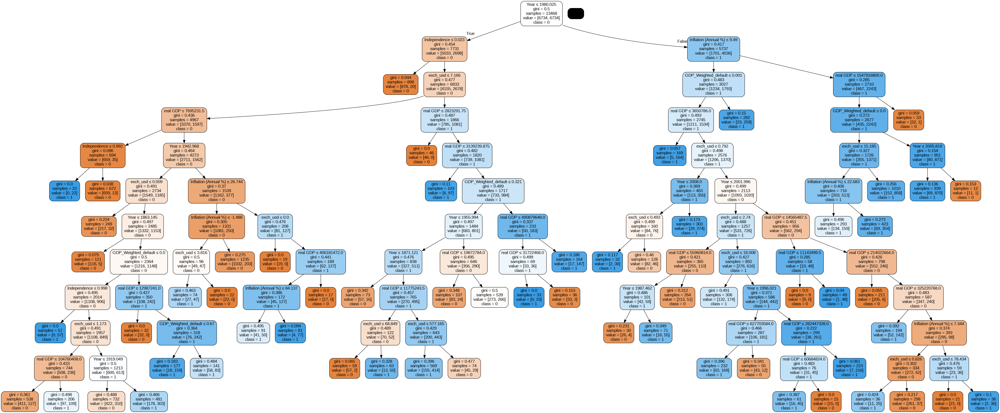

In [ ]:
# Visualize decision tree
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image
import pydotplus

dot_data = StringIO()
export_graphviz(final_clf, out_file=dot_data,
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('systemic_crisis.png')
Image(graph.create_png())